In [ ]:
pip install pandas

In [4]:
# packages/libraries
import pandas as pd
import numpy as np
import os
import json
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt

with open('/home/magali/ct_classifier/inspect_json/model_sex/ModelOutput.json', 'r') as json_file: 
    data = json.load(json_file) #path to json model output

with open('/home/magali/CV4Ecology-summer-school/FinalDataset/SubsetAgeModelCocoVal_croppedID.json', 'r') as json_file: 
    raw_data = json.load(json_file) #path to json cropped image file with image path of the val dataset

In [2]:
# we'll also import the raw data to compare the images and predictions against, to make sure the data are labelled correctly:
#path = "/home/michael/pred-detector/detection-data/train-val-data_2023-08-15.csv"

# import csv data
#raw_data = pd.read_csv(path)
#raw_data.head()

# Function to remove first parts of the string
#def remove_prefix(filepath, prefix):
#    if filepath.startswith(prefix):
#        return filepath[len(prefix):]
#    return filepath

# Define the prefix to remove
#prefix_to_remove = '/Volumes/Expansion/Data Management/Sampled Images//'

# Apply the function to the 'filepaths' column
#raw_data['new_filepath'] = raw_data['new_filepath'].apply(remove_prefix, prefix=prefix_to_remove)
#raw_data['new_filepath'] = '/mnt/ssd-cluster/procko/Sampled Images/' + raw_data['new_filepath']

This is a false_positive where 1 was the prediction, 0 was the true value, and the score values were [0.48577001690864563, 0.514229953289032]


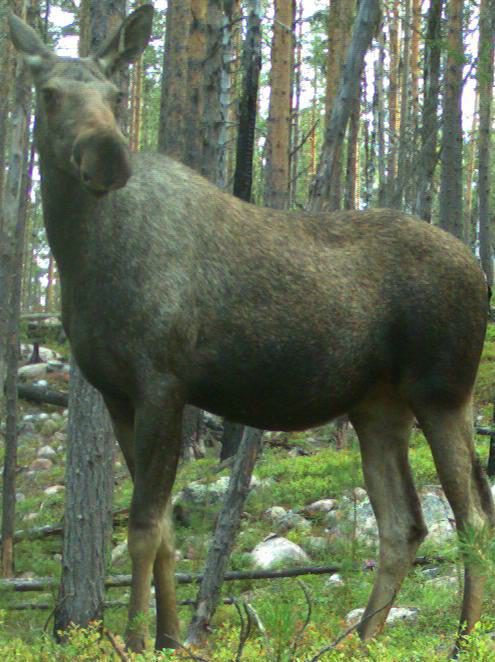

In [6]:
# Create a list to store the match categories
match_categories = []

# Iterate through the true and predicted values
for true_val, pred_val in zip(data['true_labels'], data['pred_labels']):
    if true_val == 1 and pred_val == 1:
        match_categories.append('true_positive')
    elif true_val == 1 and pred_val == 0:
        match_categories.append('false_negative')
    elif true_val == 0 and pred_val == 1:
        match_categories.append('false_positive')
    else:
        match_categories.append('true_negative')

# Add the match categories list to the dictionary
data['match_category'] = match_categories

# pick a random number
n = 18

# view an example of the updated dictionary
print("This is a", data['match_category'][n], 'where', data['pred_labels'][n], "was the prediction,",
data['true_labels'][n], 'was the true value, and the score values were', data['scores'][n])

# show the image
img = data['filepaths'][n]
pil_im = Image.open(img)
display(pil_im)

#raw_data[raw_data['new_filepath'] == data['filepaths'][n]]

In [16]:
# create false positives dictionary:
false_positives = []
for category, scores, filepaths in zip(data['match_category'], data['scores'], data['filepaths']):
     if category == 'false_positive':
         false_positives.append({'match_category': category, 'scores': scores, 'filepaths': filepaths})

# # sort by highest false confidence:
sorted_false_positives = sorted(false_positives, key=lambda x: x['scores'][1], reverse=True)
top50_false_positives = sorted_false_positives[0:50]

# create false negatives dictionary:
false_negatives = []
for category, scores, filepaths in zip(data['match_category'], data['scores'], data['filepaths']):
     if category == 'false_negative':
         false_negatives.append({'match_category': category, 'scores': scores, 'filepaths': filepaths})

# # sort by highest false confidence:
sorted_false_negatives = sorted(false_negatives, key=lambda x: x['scores'][0], reverse=True)
top50_false_negatives = sorted_false_negatives[0:50]

# # create true positives dictionary:
true_positives = []
for category, scores, filepaths in zip(data['match_category'], data['scores'], data['filepaths']):
    if category == 'true_positive':
        true_positives.append({'match_category': category, 'scores': scores, 'filepaths': filepaths})

# # sort by highest true confidence:
sorted_true_positives = sorted(true_positives, key=lambda x: x['scores'][1], reverse=True)
top50_true_positives = sorted_true_positives[0:50]

# # create true negatives dictionary:
true_negatives = []
for category, scores, filepaths in zip(data['match_category'], data['scores'], data['filepaths']):
    if category == 'true_negative':
        true_negatives.append({'match_category': category, 'scores': scores, 'filepaths': filepaths})

# sort by highest true confidence:
sorted_true_negatives = sorted(true_negatives, key=lambda x: x['scores'][0], reverse=True)
top50_true_negatives = sorted_true_negatives[0:50]


Top50 false negatives (model says female but it is male)

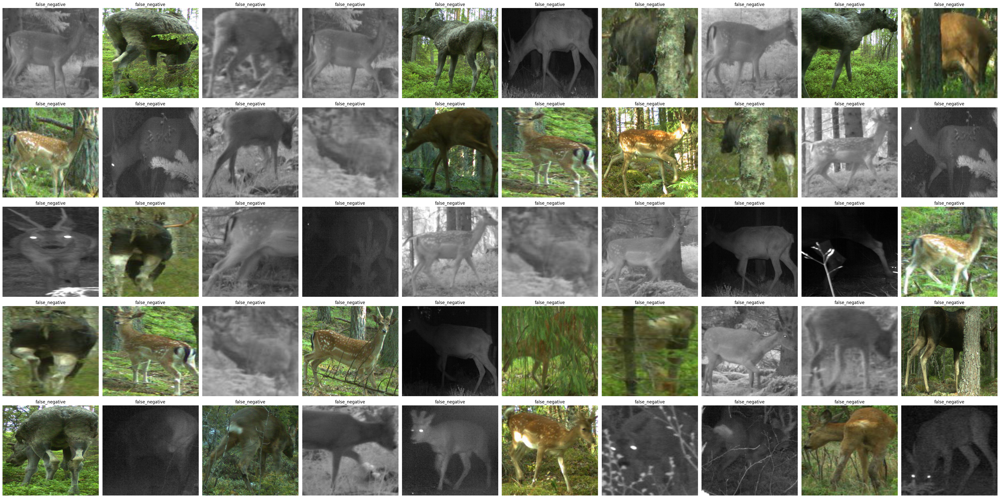

In [17]:
# Display images using the filepaths key
plt.figure(figsize=(40, 20))
for idx, entry in enumerate(top50_false_negatives):
    img = Image.open(entry['filepaths'])
    plt.subplot(5,10,idx+1)
    plt.imshow(img, aspect='auto')
    plt.title(f"{entry['match_category']}")
    plt.axis('off')
plt.tight_layout() 
plt.show()
